<h1 align="center"> CSE 242 Assignment 3, Spring 2025

Your name: Harshith Ravi Kopparam         Student ID: 2172472

## Instruction 

- Submit your assignments onto **Canvas** by the due date. Upload a **PDF** file containing:

    (1) Your solutions for both math questions.
    
    **For assignment related questions, please reach TA or grader through Slack/Discord/Email.**
    
- This is an **individual** assignment. All help from others (from the web, books other than text, or people other than the TA or instructor) must be clearly acknowledged. 

## Objective 

- **Task 1:** Perceptron (math)
- **Task 2:** Support Vector Machine (math)

# Question 1. (Perceptron, 50 pts)

## (a -- 10 pts)

On what kinds of training data does the perceptron algorithm converge?

### The perceptron algorithm converges when the training data is linearly separable. This means:

- There exists a hyperplane that can perfectly separate the positive and negative classes.
- The algorithm is guaranteed to find a solution in a finite number of steps.
- If data is not linearly separable, the algorithm will not converge.

## (b -- 5*4 + 20 pts) 

Simulate one pass through the following data with the perceptron algorithm described in lecture and homework.
Use the learning rate $\eta = 1$. 

Start with $w=(0,0,0)$ and show the resulting weight vector after each example.

(Assume that the perceptron algorithm predicts incorrectly when $w \cdot x = 0$, and ignore the bias term.)

| $x_1$  | $x_2$ | $x_3$ |   $y$ |
| :--- | :--- | :--- | :--- |
| 1 | 0 | 1 |  +1|
| 0 | -1 | 1 |  -1|
| 1 | 1 | 1 | +1|
| -1 | 2 | 0 |  -1|

Initially, $w = ( 0, 0, 0)$. 

After the first example, $w = (  1,0,1 )$;

After the second example, $w = (  1,1,0 )$;

After the third example, $w = (  1,1,0 )$;

After the fourth example, $w = (  2,-1,0 )$.

**Reminder:** Give detailed explanations about your answers.



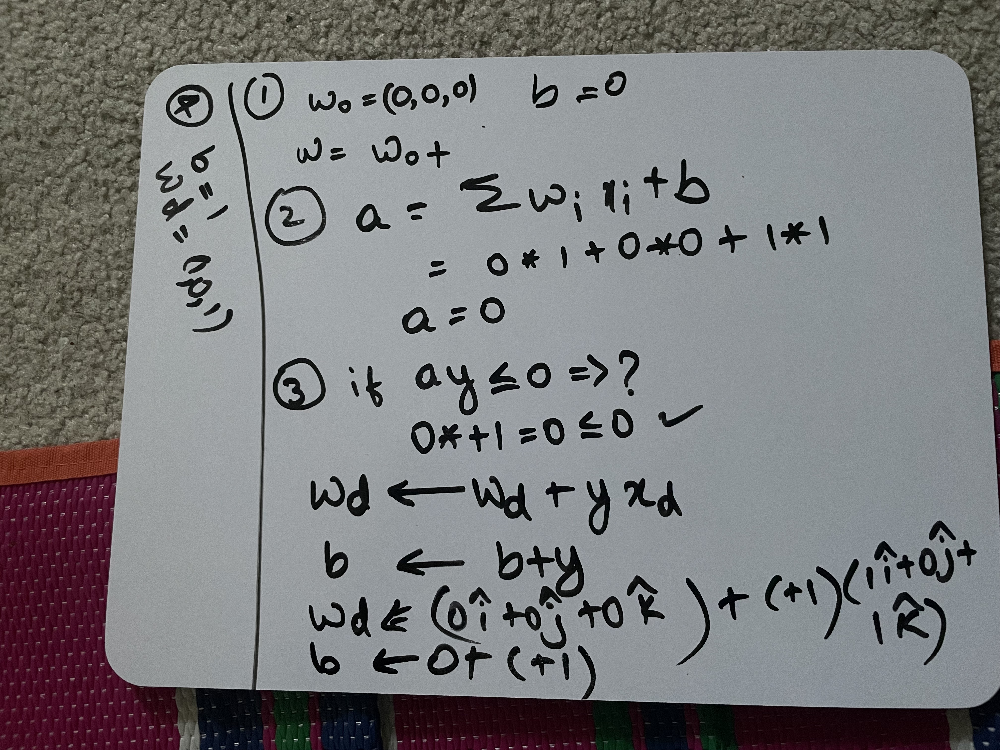

In [1]:
from IPython.display import Image
# Replace the figure name
# Image(filename='sample.png') 
Image(filename='IMG_3799 2.jpeg', width=300)

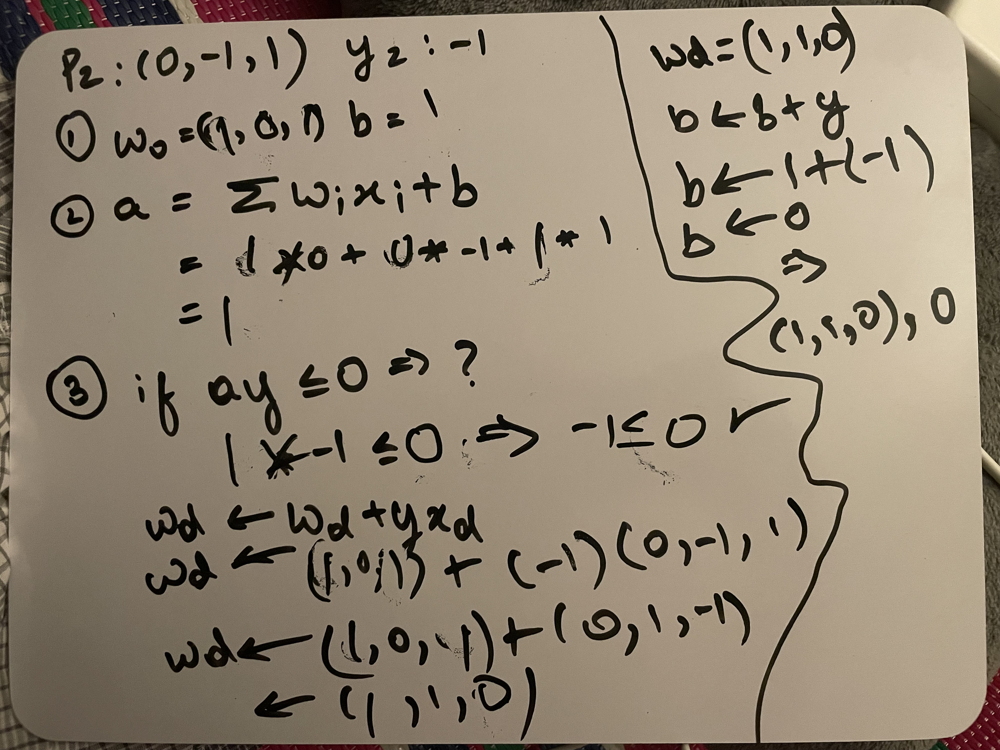

In [3]:
from IPython.display import Image
# Replace the figure name
# Image(filename='sample.png') 
Image(filename='IMG_3800.jpeg', width=300)

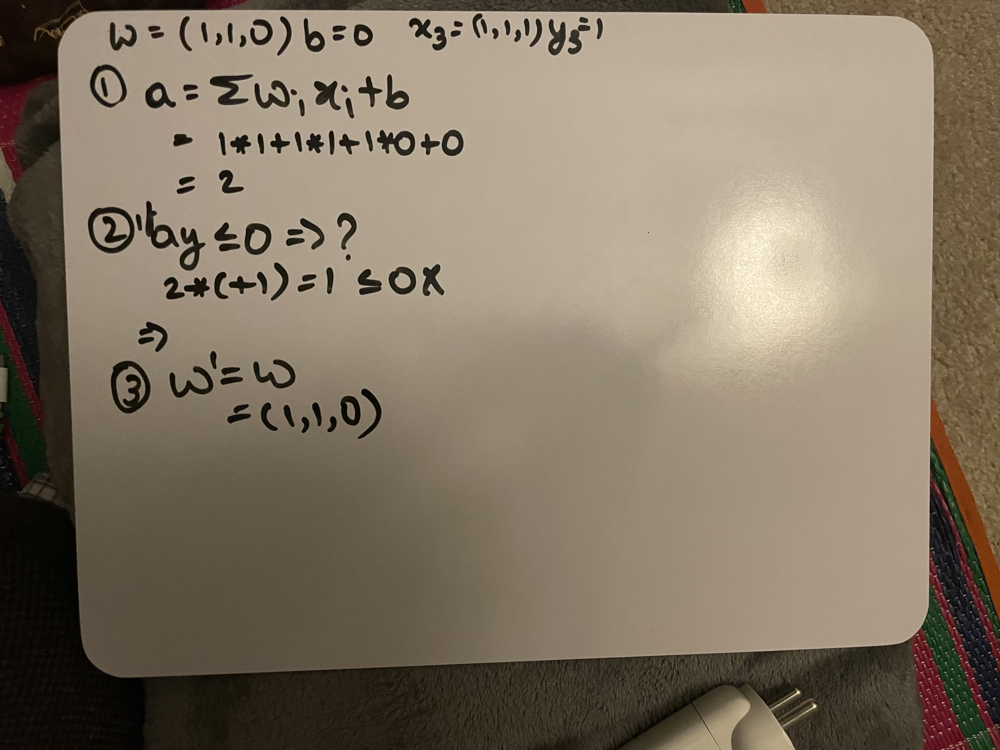

In [4]:
from IPython.display import Image
# Replace the figure name
# Image(filename='sample.png') 
Image(filename='IMG_3801.jpeg', width=300)

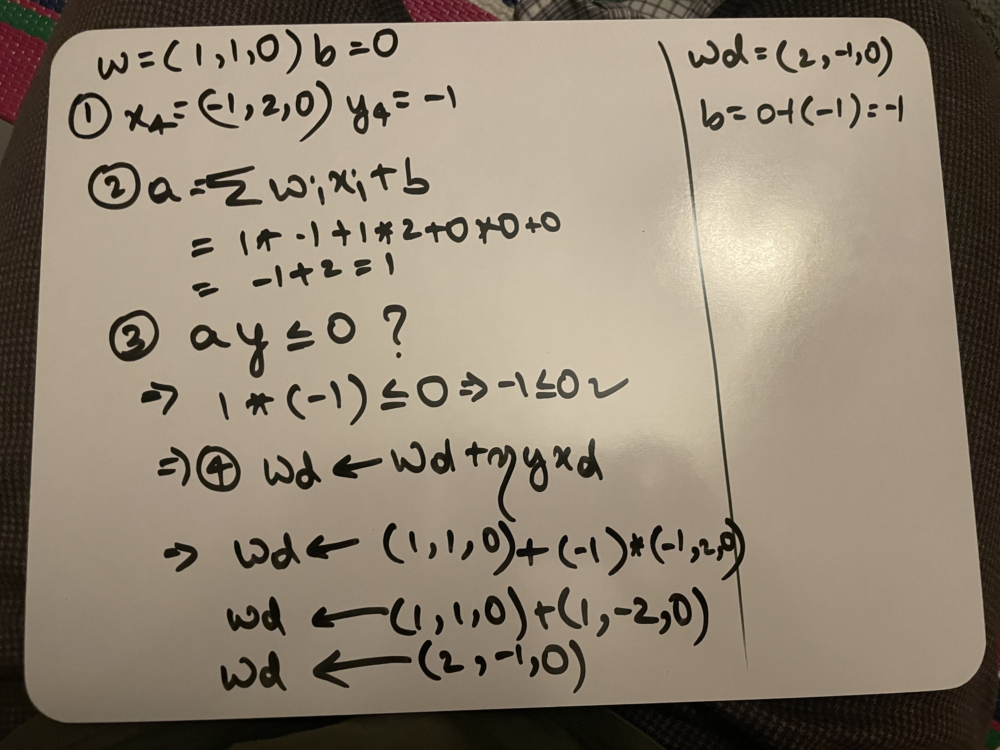

In [5]:
from IPython.display import Image
# Replace the figure name
# Image(filename='sample.png') 
Image(filename='IMG_3802.jpeg', width=300)

### As you can clearly see in the image the Perceptron learning Algorithm has been applied.

# Question 2. (Support Vector Machines, 50 pts)
Suppose that we have the following training set (where the instances have two features):

| $x_1$ | $x_2$ | $y$ |
| :--- | :--- | :--- |
| 1 | 1  |  +1|
| 1 | 2  |  +1|
| 2 | 1  |  +1|
| 0 | 0  |  -1|
| 1 | 0  |  -1|
| 0 | 1  |  -1|

## (a -- 35 pts) 

Plot them and find the support vectors, with python `sklearn`.


/Users/madhurark/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


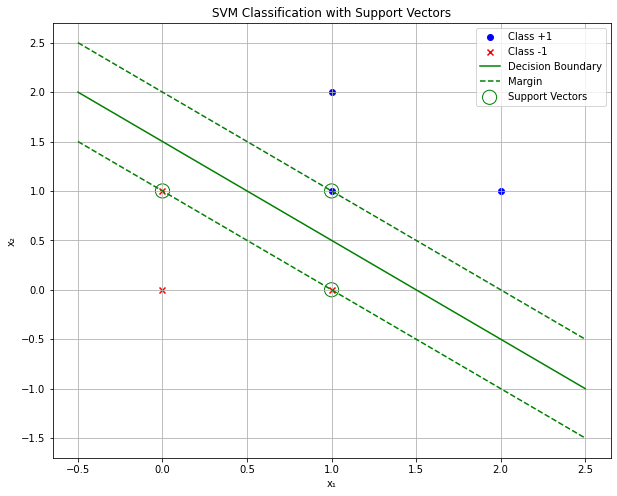

Support Vectors:
[[1. 0.]
 [0. 1.]
 [1. 1.]]


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC

# Loading the table into numpy array.
X = np.array([[1, 1], [1, 2], [2, 1], [0, 0], [1, 0], [0, 1]])
y = np.array([1, 1, 1, -1, -1, -1])

# Create and train SVM classifier
svm = SVC(kernel='linear', C=1000)  # High C for hard margin SVM
svm.fit(X, y)

# Create plotting function
def plot_svm(X, y, clf):
    plt.figure(figsize=(10, 8))
    
    # Plot data points
    plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], c='b', marker='o', label='Class +1')
    plt.scatter(X[y == -1][:, 0], X[y == -1][:, 1], c='r', marker='x', label='Class -1')
    
    # Get the separating hyperplane
    w = clf.coef_[0]
    b = clf.intercept_[0]
    x_points = np.linspace(-0.5, 2.5, 100)
    y_points = -(w[0] * x_points + b) / w[1]
    
    # Plot decision boundary
    plt.plot(x_points, y_points, 'g-', label='Decision Boundary')
    
    # Plot margins
    margin = 1 / np.sqrt(np.sum(w ** 2))
    y_points_pos = -(w[0] * x_points + b - 1) / w[1]
    y_points_neg = -(w[0] * x_points + b + 1) / w[1]
    plt.plot(x_points, y_points_pos, 'g--', label='Margin')
    plt.plot(x_points, y_points_neg, 'g--')
    
    # Highlight support vectors
    support_vectors = X[clf.support_]
    plt.scatter(support_vectors[:, 0], support_vectors[:, 1], 
               s=200, facecolors='none', edgecolors='g',
               label='Support Vectors')
    
    plt.xlabel('x₁')
    plt.ylabel('x₂')
    plt.title('SVM Classification with Support Vectors')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the results
plot_svm(X, y, svm)

# Print support vectors
print("Support Vectors:")
print(svm.support_vectors_)

## (b -- 15 pts) 

Using the support vectors, find the equation for the maximum margin separating plane, and determine the geometric margin. (Assume a simple linear SVM and no soft-margin). 

In [2]:
# Get the parameters of the hyperplane
w = svm.coef_[0]
b = svm.intercept_[0]

# geometric margin: 1/((W^2)^0.5)
margin = 1 / np.sqrt(np.sum(w ** 2))

print(f"Weight vector w: {w}")
print(f"Bias term b: {b}")
print(f"Geometric margin: {margin}")

# The separating hyperplane equation is w₁x₁ + w₂x₂ + b = 0
print("\nSeparating hyperplane equation:")
print(f"{w[0]:.3f}x₁ + {w[1]:.3f}x₂ + {b:.3f} = 0")

Weight vector w: [2. 2.]
Bias term b: -3.0
Geometric margin: 0.35355339059327373

Separating hyperplane equation:
2.000x₁ + 2.000x₂ + -3.000 = 0
